# SRGAN 활용하기

## 학습 목표

- Super Resolution과 그 과정 수행에 필요한 기본 개념을 이해합니다.
- Super Resolution에 사용되는 대표적인 2개의 구조(SRCNN, SRGAN)에 대해 이해하고 활용합니다.

## 루브릭

|평가문항	|상세기준|
|:---|:---|
|1. SRGAN을 이용해 고해상도의 이미지를 생성하였다.|SRGAN을 통해 생성된 이미지를 제출하였다.|
|2. 다양한 해상도의 이미지에 대해 시각화를 통해 원본, SRGAN생성본, interpolation생성본을 비교분석하였다.|이미지의 특성과 super resolution 방법을 관련지어 생성 결과를 체계적으로 분석하였다.|
|3. 저해상도 gif 동영상을 고해상도 동영상으로 성공적으로 변환하였다.|저해상도 원본 gif와 생성된 고해상도 gif의 해상도 차이가 시각적으로 확인 가능하다.|

## 목차
- 프로젝트에 필요한 개념정리
- 프로젝트 1 : 직접 고른 이미지로 SRGAN 실험하기
    - 프로젝트 1-1. 고해상도 이미지로 Super Resolution 수행하기
    - 프로젝트 1-2. 저해상도 이미지로 Super Resolution 수행하기
- 프로젝트 2 : SRGAN을 이용해 고해상도 gif 생성하기

## 프로젝트에 필요한 개념정리

### Super Resolution

- 픽셀(pixel) 은 디스플레이를 구성하고 있는 가장 작은 단위를 말합니다.
- RGB 각각을 Sub-Pixel이라고 하고, RGB 3개를 모아 놓은 것은 One-Pixel이라고 합니다.
- 해상도는 가로 및 세로의 픽셀 수로 표기하며, 픽셀의 개수가 많을수록 고해상도가 되어 선명해집니다.
-  Super Resolution(초해상화)란 저해상도 영상을 고해상도 영상으로 변환하는 작업 또는 그러한 과정을 말합니다.

### Super Resolution을 어렵게 만드는 요인들
- 1. ill-posed (inverse) problem
    - 하나의 저해상도 이미지에 대해 여러 개의 고해상도 이미지가 나올 수 있다는 것
- 2. Super Resolution 문제의 복잡도
     - 2x2 크기의 이미지를 이용해 3x3, 4x4, 5x5 크기의 이미지로 Super Resolution 하게되면 3x3 크기의 이미지 만드는 경우 새롭게 생성해야 하는 정보는 최소 5개 픽셀이며, 4x4의 경우 12개, 5x5의 경우 21개의 정보를 생성해야 합니다.
     - 원래 가진 제한된 정보만을 이용해 많은 정보를 만들어내는 과정은 매우 복잡하며 그만큼 잘못된 정보를 만들어 낼 가능성 또한 높습니다.
- 3. 결과를 평가하는 데 있어 정량적 평가 척도와 사람의 평가가 잘 일치하지 않는점

### Interpolation

- interpolation(보간법)이란 알려진 두 점 사이의 특정 지점에 대한 값을 추정하는 방법
- Linear interpolation을 2차원으로 확장한 것이 bilinear interpolation입니다. Linear interpolation의 경우 2개의 값을 이용해 새로운 픽셀을 예측하며, bilinear interpolation은 4개의 값을 이용합니다.

### SRCNN
- SRCNN은 2014년 발표된 "Image Super-Resolution Using Deep Convolutional Networks" 논문에서 사용되었습니다.

아래 그림이 SRCNN 구조입니다. 간략하게 살펴봅시다.

![Sketch of the SRCNN architecture.](https://images.deepai.org/converted-papers/1808.03344/SRCNN.png)

가장 먼저 저해상도 이미지(그림의 LR)를 bicubic interpolation 하여 원하는 크기로 이미지를 늘립니다. SRCNN은 이 이미지(그림의 ILR)를 입력으로 사용합니다. 이후 3개의 convolutional layer를 거쳐 고해상도 이미지를 생성해 냅니다. 생성된 고해상도 이미지와 실제 고해상도 이미지 사이의 차이를 역전파 하여 신경망의 가중치를 학습합니다. 

1. Patch extraction and representation : 저해상도 이미지에서 patch를 추출한다.
2. Non-linear mapping : Patch를 다른 차원의 patch로 비선형 매핑한다.
3. Reconstruction : Patch로부터 고해상도 이미지를 생성한다.

loss function은 MSE를 사용하였습니다.
MSE loss function은 보통의 딥러닝 모델들에 많이 쓰이는 function으로 평균제곱오차값이며 전체적인 학습에 효과는 좋지만, 이 후 high frequency의 특징들을 잘 못 잡아내기 때문에 다른 loss function을 사용한 SR 딥러닝 모델들이 등장하게 됩니다.

### GAN

- 확률분포를 알면 그 데이터의 예측 기댓값, 데이터의 분산을 즉각 알아낼 수 있어 데이터의 통계적 특성을 바로 분석할 수 있으며, 주어진 확률분포를 따르도록 데이터를 임의 생성하면 그 데이터는 확률분포를 구할 때 사용한 원 데이터와 유사한 값을 가집니다.
- GAN과 같은 비지도학습이 가능한 머신러닝 알고리즘으로 데이터에 대한 확률분포를 모델링 할 수 있게 되면, 원 데이터와 확률분포를 정확히 공유하는 무한히 많은 새로운 데이터를 새로 생성할 수 있음을 의미합니다.
- GAN의 학습이 완료되었을 때, Generator의 경우 원 데이터의 확률분포를 따르는 새로운 데이터를 만들며, Discriminator의 경우 분류에 의미가 없는 0.5의 확률값을 출력하게됩니다.
(출처:[GAN - 스스로 학습하는 인공지능](https://www.samsungsds.com/kr/insights/Generative-adversarial-network-AI.html))

### SRGAN = Super Resoultion + GAN

SRGAN은 2016년 발표된 "Photo-Realistic Single Image Super-Resolution Using a Generative Adversarial Network" 논문에서 제안되었으며, 아래 그림과 같이 이전에 학습한 SRCNN 보다 조금 복잡한 구조를 갖습니다.

![srgan_architecture](https://d3s0tskafalll9.cloudfront.net/media/images/e-22-14.srgan.max-800x600.png)
[출처: https://arxiv.org/pdf/1609.04802.pdf]

Generator가 저해상도 이미지를 입력 받아 (가짜)고해상도 이미지를 생성해 내면, Discriminator는 생성된 (가짜)고해상도 이미지와 실제(진짜) 고해상도 이미지 중 진짜를 판별합니다.

SRGAN에서 사용하는 loss function은 아래와 같이 조금 특별합니다.
![srgan_lossfunction](https://d3s0tskafalll9.cloudfront.net/media/images/e-22-15.srgan_loss.max-800x600.png)

위 식을 보면 크게 content loss와 adversarial loss로 구성되어 있고, 이 중 adversarial loss는 우리가 일반적으로 알고 있는 GAN의 loss이며, 조금 특별한 부분은 아래 그림으로 나타낸 content loss 부분입니다.

content loss는 Generator를 이용해 얻어낸 (가짜) 고해상도 이미지를 실제 (진짜) 고해상도 이미지와 직접 비교하는 것이 아니라, 각 이미지를 이미지넷으로 사전 학습된(pre-trained) VGG 모델에 입력하여 나오는 feature map에서의 차이를 계산합니다.

즉, 이전에 학습했던 SRCNN은 생성해낸 고해상도 이미지를 원래 고해상도 이미지와 직접 비교하여 loss를 계산했지만, SRGAN에서는 생성된 고해상도 이미지와 실제 고해상도 이미지를 VGG에 입력하여 모델 중간에서 추출해낸 특징을 비교해서 loss를 계산합니다.

SRGAN은 VGG를 이용한 content loss 및 GAN을 사용함으로써 발생하는 adversarial loss를 합하여 최종적으로 perceptual loss라고 정의하며 이를 학습에 이용합니다.

## 프로젝트 1 : 직접 고른 이미지로 SRGAN 실험하기

### 프로젝트 1-1.  고해상도 이미지로 Super Resolution 수행하기

#### 1. 데이터 준비 

(적당히) 높은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.

Matplotlib is building the font cache; this may take a moment.


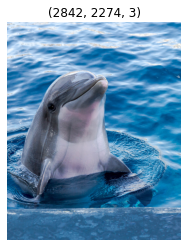

In [1]:
import os
import cv2
import matplotlib.pyplot as plt

img_path = os.getenv('HOME') + '/aiffel/super_resolution/'
hr = cv2.imread(img_path + 'dolphin.jpg')

plt.imshow(cv2.cvtColor(hr, cv2.COLOR_BGR2RGB))
plt.title(hr.shape)
plt.axis('off')
plt.show()

#### 2. 이미지 리사이즈

우선 불러온 이미지의 크기를 줄여 저해상도로 낮춰보겠습니다. opencv 라이브러리의 resize()를 이용해 이미지의 크기를 조절합니다.
불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 1/4로 줄입니다. 

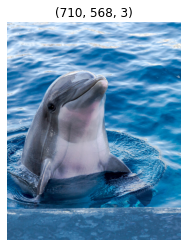

In [2]:
lr = cv2.resize(hr, 
                (hr.shape[1]//4, hr.shape[0]//4), # 이미지 크기 1/4로 설정
                cv2.INTER_CUBIC) # bicubic 설정

plt.imshow(cv2.cvtColor(lr, cv2.COLOR_BGR2RGB))
plt.title(lr.shape)
plt.axis('off')
plt.show()

#### 3. SRGAN을 이용해 고해상도 이미지를 생성

줄인 저해상도 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.

In [3]:
import numpy as np
import tensorflow as tf

model_file = os.getenv('HOME')+'/aiffel/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

In [4]:
srgan_hr = apply_srgan(lr)

#### 4.  Bicubic interpolation을 적용해 고해상도 이미지를 생성
2.의 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. 마찬가지로 cv2.resize()를 사용해 봅시다.

In [5]:
hr, lr = np.array(hr), np.array(lr)
bicubic_hr = cv2.resize(
    lr, 
    dsize=(lr.shape[1]*4, lr.shape[0]*4), # 이미지 크기 4배로 설정
    interpolation=cv2.INTER_CUBIC # bicubic 설정
)

#### 5. 생성한 이미지 시각화(Bicubic, SRGAN)

3개 이미지(4.의 Bicubic의 결과, 3.의 SRGAN의 결과, 1.의 원래 고해상도 이미지)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.

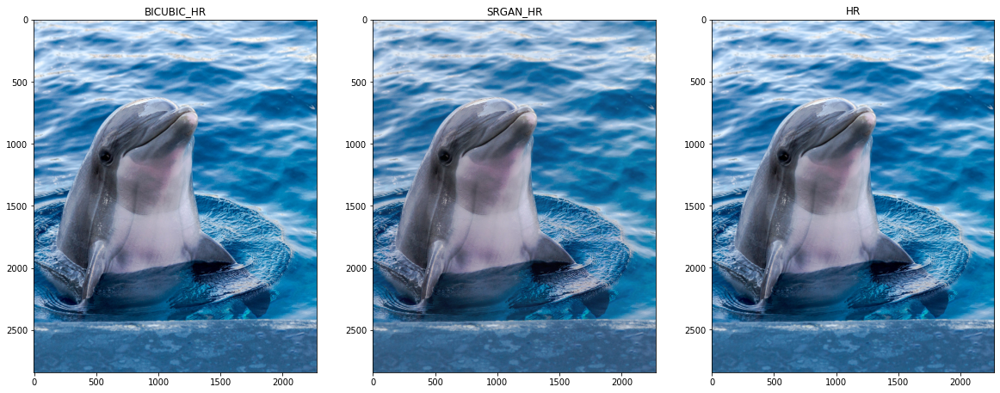

In [6]:
plt.figure(figsize=(20,10))

plt.subplot(1,3,1); plt.imshow(cv2.cvtColor(bicubic_hr, cv2.COLOR_BGR2RGB))
plt.title('bicubic_hr'.upper())

plt.subplot(1,3,2); plt.imshow(cv2.cvtColor(srgan_hr, cv2.COLOR_BGR2RGB))
plt.title('srgan_hr'.upper())

plt.subplot(1,3,3); plt.imshow(cv2.cvtColor(hr, cv2.COLOR_BGR2RGB))
plt.title('hr'.upper())

plt.show()

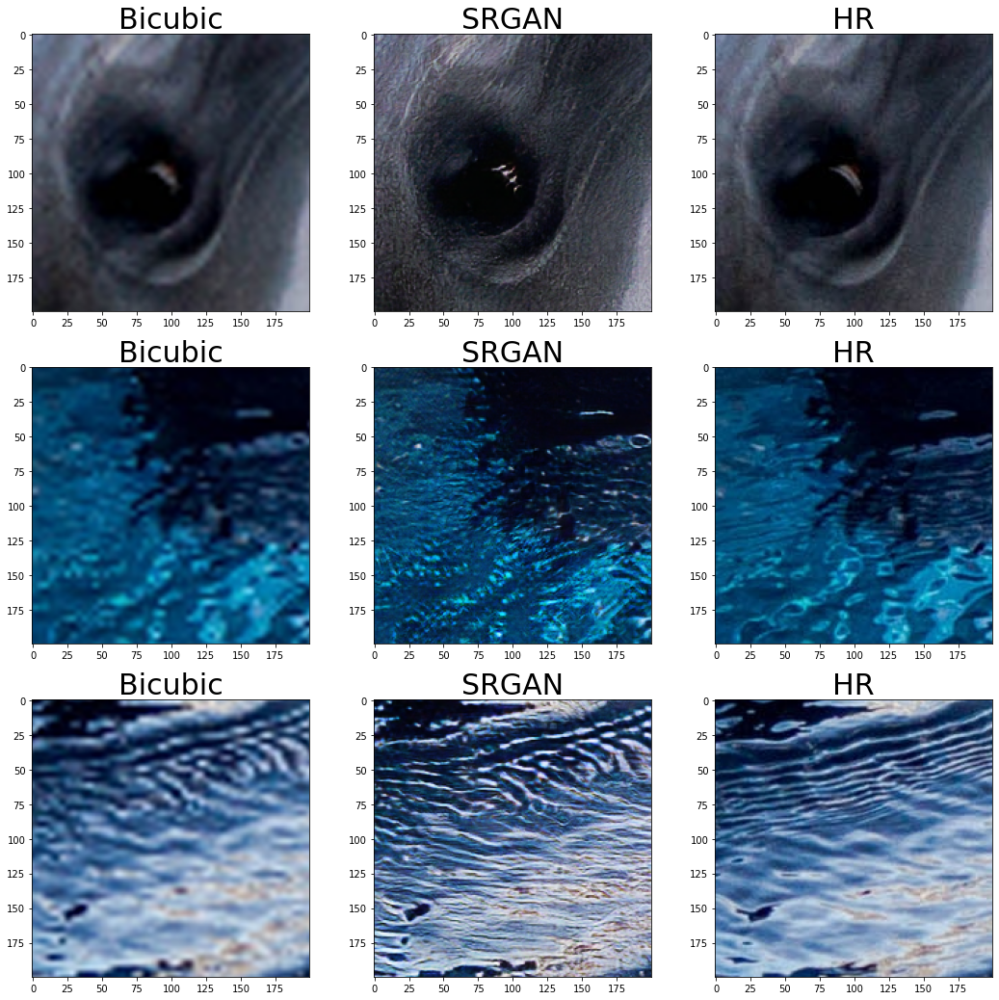

In [7]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 이미지의 특정 부분을 잘라내는 함수를 정의합니다.
def crop(image, left_top, x=200, y=200):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(1000,500), (2000,1200), (2000,1500)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srgan_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRGAN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)

시각화 결과 Bicubic interpolation 방법을 이용한 결과는 HR이라 쓰여진 실제 고해상도 이미지와 비교하면 선명하지 않은 것을 확인 할 수 있습니다.SRGAN은 실제 이미지보다 보다 훨씬 더 선명한 이미지 결과를 얻었습니다! 특히 경계선이 뚜렷하게 구분되어 질감이 두드러지게 표현되었습니다.

#### 6. SRCNN을 이용해 고해상도 이미지를 생성

선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다.

- 데이터셋: [DIV2K datasets](https://data.vision.ee.ethz.ch/cvl/DIV2K/)<br>
- DIV2K 데이터셋은 많은 Super Resolution 연구에서 학습 및 평가에 사용되는 데이터셋이며 800개의 학습용 데이터셋 및 100개의 검증용 데이터셋으로 구성되어 있습니다.<br>
- 사용할 데이터셋은 div2k/bicubic_x4 이며, 이는 DIV2K 데이터셋 중에서 실제 고해상도 이미지를 대상으로 bicubic interpolation을 이용해 가로 및 세로 픽셀 수를 1/4배로 줄인 데이터셋 입니다. 이렇게 만들어진 저해상도 이미지와 원래 고해상도 이미지가 서로 한 쌍으로 구성되어 있습니다.

SRCNN을 사용해보기 위해 이미 학습이 완료된 SRCNN 모델을 불러옵니다.

In [8]:
model_file = os.getenv('HOME')+'/aiffel/super_resolution/srcnn.h5'
srcnn = tf.keras.models.load_model(model_file)

In [9]:
def apply_srcnn(image):
    sr = srcnn.predict(image[np.newaxis, ...]/255.)
    sr[sr > 1] = 1
    sr[sr < 0] = 0
    sr *= 255.
    return np.array(sr[0].astype(np.uint8))

srcnn_hr = apply_srcnn(bicubic_hr)

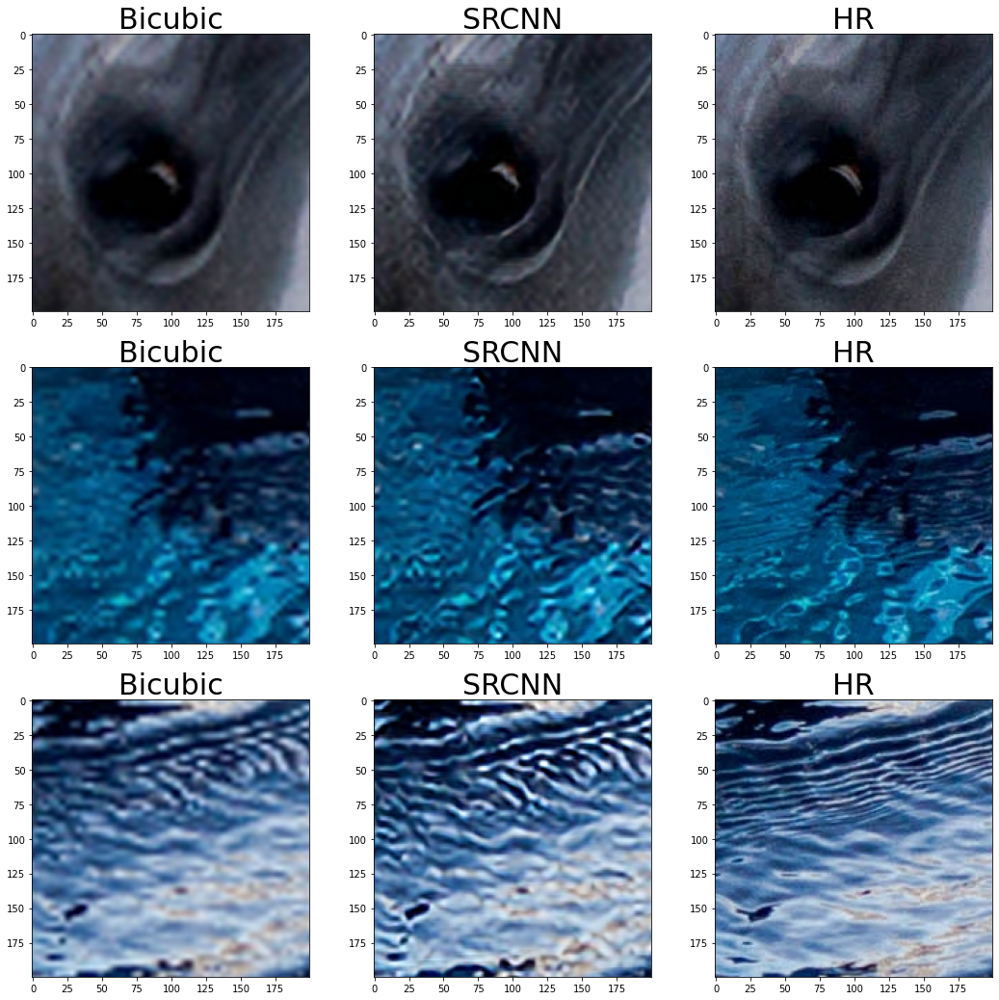

In [10]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(1000,500), (2000,1200), (2000,1500)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 200, 200)
    img2 = crop(srcnn_hr , left_top, 200, 200)
    img3 = crop(hr, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRCNN", "HR"] * 3

plt.figure(figsize=(18,18))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)
plt.show()

SRCNN으로 생성된 이미지는 Bicubic 보다는 선명한 이미지가 생성되었으나 원본과 SRGAN으로 생성된 이미지 보다는 흐릿합니다.

#### 7. Super Resolution 결과 평가하기

이번에는 앞서 실험했던 SRCNN과 SRGAN의 결과를 시각적으로 비교해봅니다.

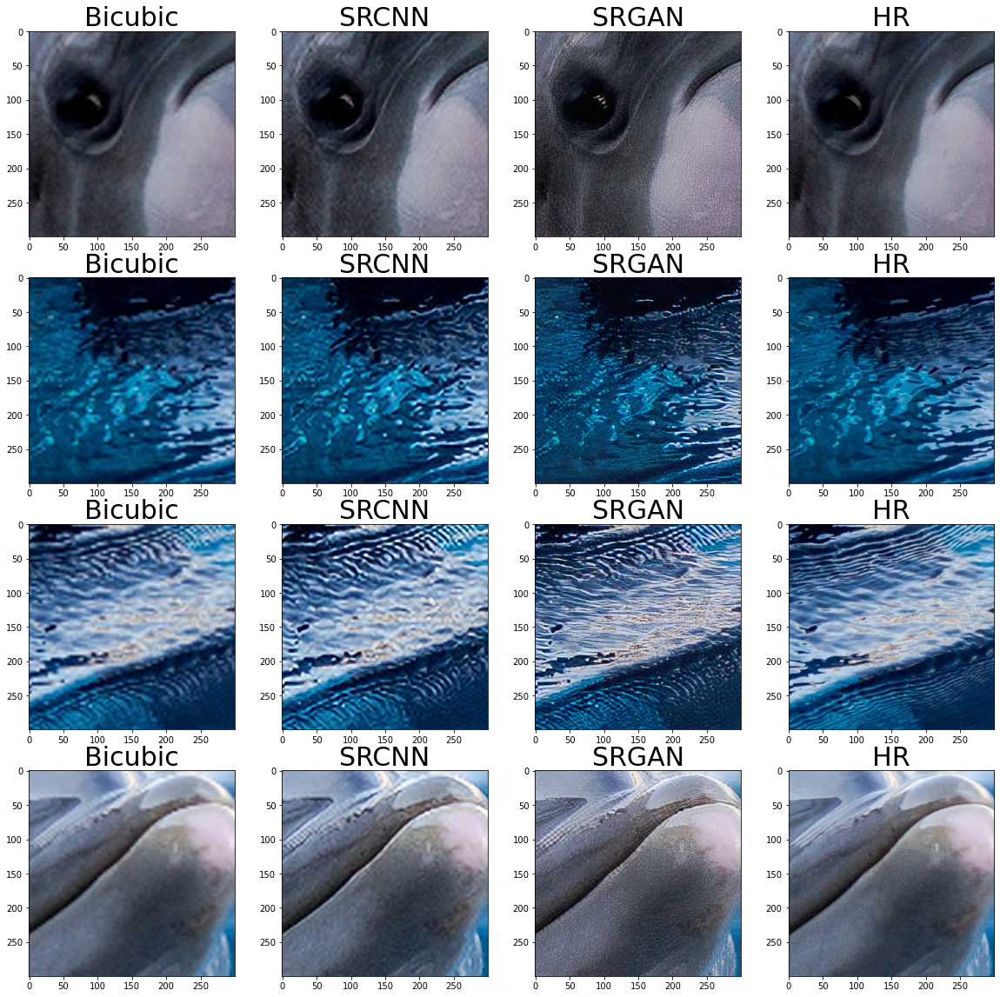

In [21]:
left_tops = [(1000,500), (2000,1200), (2000,1500), (700, 1000)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr, left_top, 300, 300)
    img2 = crop(srcnn_hr , left_top, 300, 300)
    img3 = crop(srgan_hr, left_top, 300, 300)
    img4 = crop(hr, left_top, 300, 300)
    images.extend([img1, img2, img3, img4])

labels = ["Bicubic", "SRCNN", "SRGAN", "HR"]*4

plt.figure(figsize=(20,20))
for i in range(16):
    plt.subplot(4,4,i+1) 
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)
plt.show()

SRGAN이 선명하게 보이기 때문에 더 고해상도의 이미지가 생성되었다고 보입니다. 하지만 원본 이미지와 비교하자면 SRCNN이 더 유사하다고 생각합니다.

![figure](https://user-images.githubusercontent.com/32256247/133278317-36425e05-3255-45b8-813b-ac9e1e0b0a57.png)
reference:https://openaccess.thecvf.com/content_ICCV_2017/papers/Sajjadi_EnhanceNet_Single_Image_ICCV_2017_paper.pdf

[1]의 이미지가 우리가 원본인 고해상도 이미지로, [2]번은 원본 이미지를 다운샘플링 시킨 이미지 입니다. 이 과정에서 본래의 특징이 뭉게지게 됩니다. 우리가 사용한 SRCNN모델과 같이 MSE를 이용하여 생성된 이미지[3]는 평균적으로 높은 값들 만 뽑아내기 때문에 가로 세로로 되어 있는 특징?이 중요하게 구분 되지 않는 블러리한 이미지가 생성되며, SRGAN 처럼 adversarial loss를 이용하면 [4] 세로가 다시 세로로 생성되지는 않았지만 선명하게 보이는 것이 장점이라고 합니다. 픽셀의 크기가 작으면 사람들이 세부 특징까지는 눈으로 구분 할 수 없기 때문에 사람들이 판단하기엔 GAN이 선명하게 보이나 의사결정 문제에 따라 어떤 것을 채택 할지는 달라 질 수 있습니다.

정량적인 평가 척도를 이용하여 결과를 비교해보겠습니다.

> __PSNR__(Peak Signal-to-Noise Ratio)은 영상 내 신호가 가질 수 있는 최대 신호에 대한 잡음(noise)의 비율을 나타냅니다. 일반적으로 영상을 압축했을 때 화질이 얼마나 손실되었는지 평가하는 목적으로 사용됩니다. 데시벨(db) 단위를 사용하며, PSNR 수치가 높을수록 원본 영상에 비해 손실이 적다는 의미입니다 (값이 높을수록 좋습니다).

> __SSIM__(Structural Similarity Index Map)은 영상의 구조 정보를 고려하여 얼마나 구조 정보를 변화시키지 않았는지를 계산합니다. 특정 영상에 대한 SSIM값이 높을수록 원본 영상의 품질에 가깝다는 의미입니다 (마찬가지로 값이 높을수록 좋습니다).

In [30]:
print(hr.shape, bicubic_hr.shape, srcnn_hr.shape, srgan_hr.shape)

(2842, 2274, 3) (2840, 2272, 3) (2840, 2272, 3) (2840, 2272, 3)


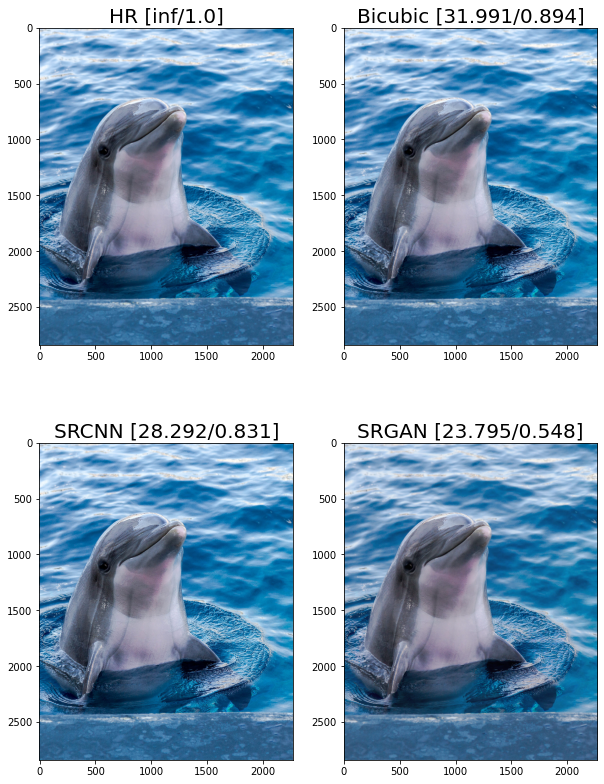

In [36]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

hr_resized = cv2.resize(hr, dsize=(2272, 2840))
images = [hr_resized, bicubic_hr, srcnn_hr, srgan_hr]
titles = ["HR", "Bicubic", "SRCNN", "SRGAN"]

# 각 이미지에 대해 PSNR을 계산하고 반올림합니다.
psnr = [round(peak_signal_noise_ratio(hr_resized, i), 3) for i in images]
# 각 이미지에 대해 SSIM을 계산하고 반올림합니다.
ssim = [round(structural_similarity(hr_resized, i, multichannel=True), 3) for i in images]

# 이미지 제목에 PSNR과 SSIM을 포함하여 시각화 합니다. 
plt.figure(figsize=(10,14))
for i in range(4):
    plt.subplot(2,2,i+1)
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(titles[i] + f" [{psnr[i]}/{ssim[i]}]", fontsize=20)

정량적인 평가 척도를 이용하여 결과를 비교해았을 때, 눈으로 판단한 것과는 정반대의 결과를 보입니다.
BIBUBIC > SRCNN > SRGAN 순으로 원본 이미지에 비해 손실이 적었으며, 원본의 구조 정보를 변화시키지 않았다는 결과를 확인할 수 있었습니다.
특히 SRGAN이 원본의 구조 정보를 많이 변화시켰고, 이런 이유때문에 의료영상 같은 분야에서는 SRGAN을 사용하기 어려울 것 같습니다.

### 프로젝트 1-2. 저해상도 이미지로 Super Resolution 수행하기

#### 1. 데이터 준비
(적당히) 낮은 해상도를 가진 이미지를 검색해서 한 장 고른 후 저장하고 불러옵니다.

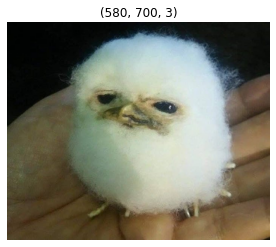

In [39]:
img_path = os.getenv('HOME') + '/aiffel/super_resolution/'
lr_img = cv2.imread(img_path + 'monday_bird.jpg')

plt.imshow(cv2.cvtColor(lr_img, cv2.COLOR_BGR2RGB))
plt.title(lr_img.shape)
plt.axis('off')
plt.show()

#### 2. SRGAN을 이용해 고해상도 이미지를 생성

불러온 이미지를 입력으로 SRGAN을 이용해 고해상도 이미지를 생성합니다. 이전에 사용한 apply_srgan 함수를 사용하면 쉽습니다.

In [40]:
srgan_hr_img = apply_srgan(lr_img)

#### 3. 이미지 리사이즈

1.에서 불러온 이미지에 bicubic interpolation을 적용해 가로 및 세로 픽셀 수를 다시 4배로 늘립니다. cv2.resize()를 사용해 봅시다.

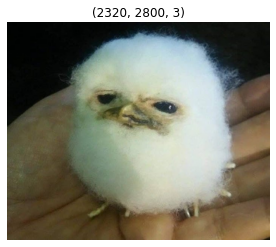

In [42]:
bicubic_hr_img = cv2.resize(lr_img, 
                (lr_img.shape[1]*4, lr_img.shape[0]*4), # 이미지 크기 4배로 설정
                cv2.INTER_CUBIC) # bicubic 설정

plt.imshow(cv2.cvtColor(bicubic_hr_img, cv2.COLOR_BGR2RGB))
plt.title(bicubic_hr_img.shape)
plt.axis('off')
plt.show()

#### 4. 생성한 이미지 시각화(Bicubic, SRGAN)
2개 이미지(3.의 Bicubic의 결과, 2.의 SRGAN의 결과)를 나란히 시각화합니다. 각 이미지의 제목에 어떤 방법에 대한 결과인지 표시해 주세요. 이전 시각화에 사용했던 코드를 참고하면 어렵지 않습니다.

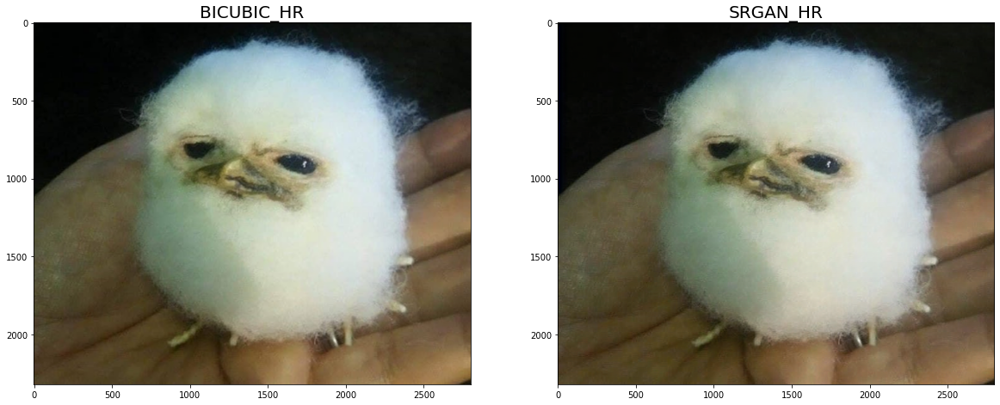

In [45]:
plt.figure(figsize=(20,10))

plt.subplot(1,2,1); plt.imshow(cv2.cvtColor(bicubic_hr_img, cv2.COLOR_BGR2RGB))
plt.title('bicubic_hr'.upper(),fontsize=20)

plt.subplot(1,2,2); plt.imshow(cv2.cvtColor(srgan_hr_img, cv2.COLOR_BGR2RGB))
plt.title('srgan_hr'.upper(),fontsize=20)

plt.show()

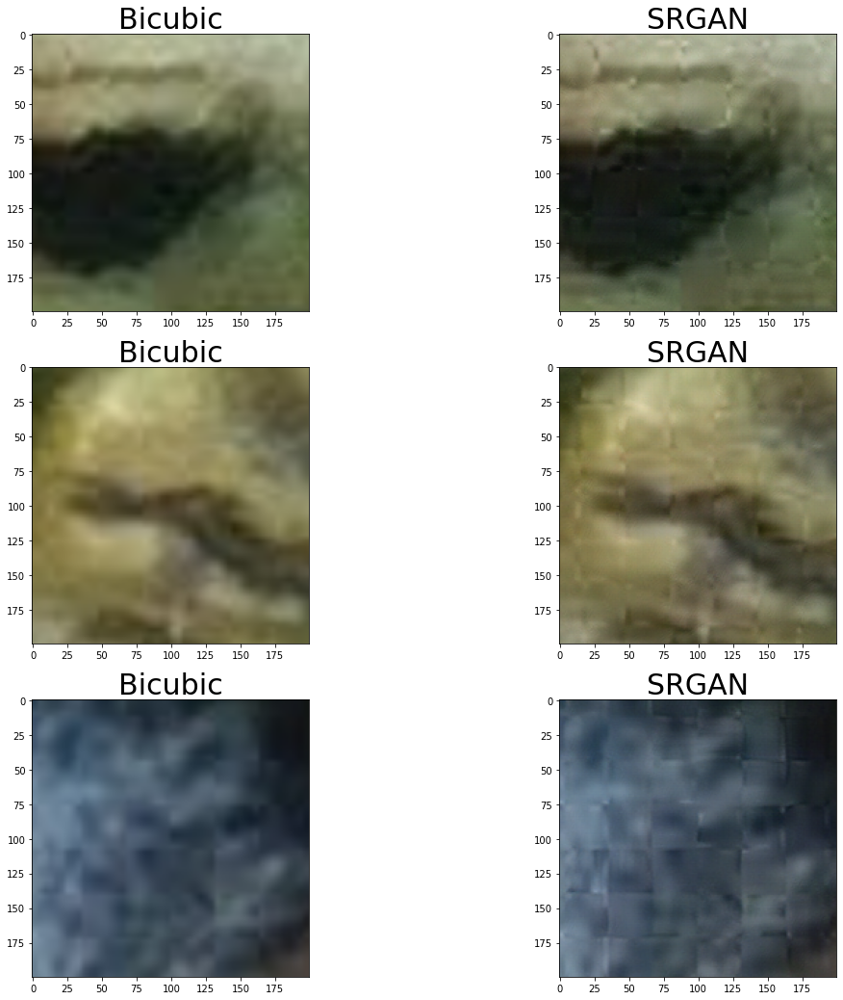

In [56]:
# 자세히 시각화 하기 위해 3개 영역을 잘라냅니다.
# 이미지의 특정 부분을 잘라내는 함수를 정의합니다.
def crop(image, left_top, x=200, y=200):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(700,1000), (900,1200), (500,2300)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr_img, left_top, 200, 200)
    img2 = crop(srgan_hr_img , left_top, 200, 200)
    images.extend([img1, img2])

labels = ["Bicubic", "SRGAN"] * 3

plt.figure(figsize=(18,18))
for i in range(6):
    plt.subplot(3,2,i+1) 
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)

시각화 결과 Bicubic interpolation 방법을 이용한 결과는 SRGAN은 둘 다 흐릿한 이미지가 생성되었습니다. 두 이미지 모두 격자 무늬 같은 경계선들이 보이는데 SRGAN으로 생성된 이미지의 경계선(노이즈) 들이 더 또렷히 보입니다. 때문에 Bicubic으로 생성된 이미지가 비교적 더 깔끔한 이미지로 생각됩니다.

#### 5. SRCNN을 이용해 고해상도 이미지를 생성
선택한 이미지를 DIV2K 데이터셋에서 학습된 모델로 Super Resolution했을 때 어떠한 결과가 나왔으며, 왜 이러한 결과가 출력되었는지 설명해 봅시다. (정답은 없습니다)

In [54]:
srcnn_hr_img = apply_srcnn(bicubic_hr_img)

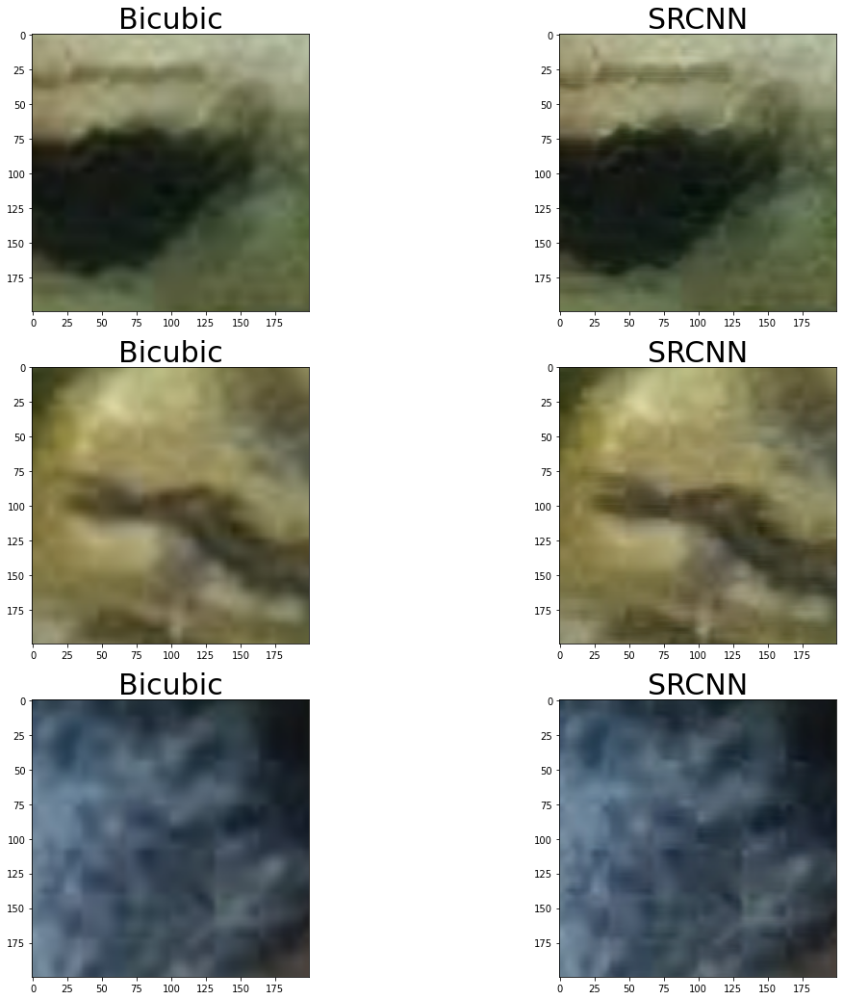

In [57]:
# 아래는 잘라낸 부분의 좌상단 좌표 3개 입니다.
left_tops = [(700,1000), (900,1200), (500,2300)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr_img, left_top, 200, 200)
    img2 = crop(srcnn_hr_img , left_top, 200, 200)
    images.extend([img1, img2])

labels = ["Bicubic", "SRCNN"] * 3

plt.figure(figsize=(18,18))
for i in range(6):
    plt.subplot(3,2,i+1) 
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)

위의 결과와 크게 다르지는 않지만 SRCNN으로 생성된 이미지가 SRGAN보다 흐릿한 편으로 보입니다.

#### 7. Super Resolution 결과 평가하기

이번에는 앞서 실험했던 SRCNN과 SRGAN의 결과를 시각적으로 비교해봅니다.

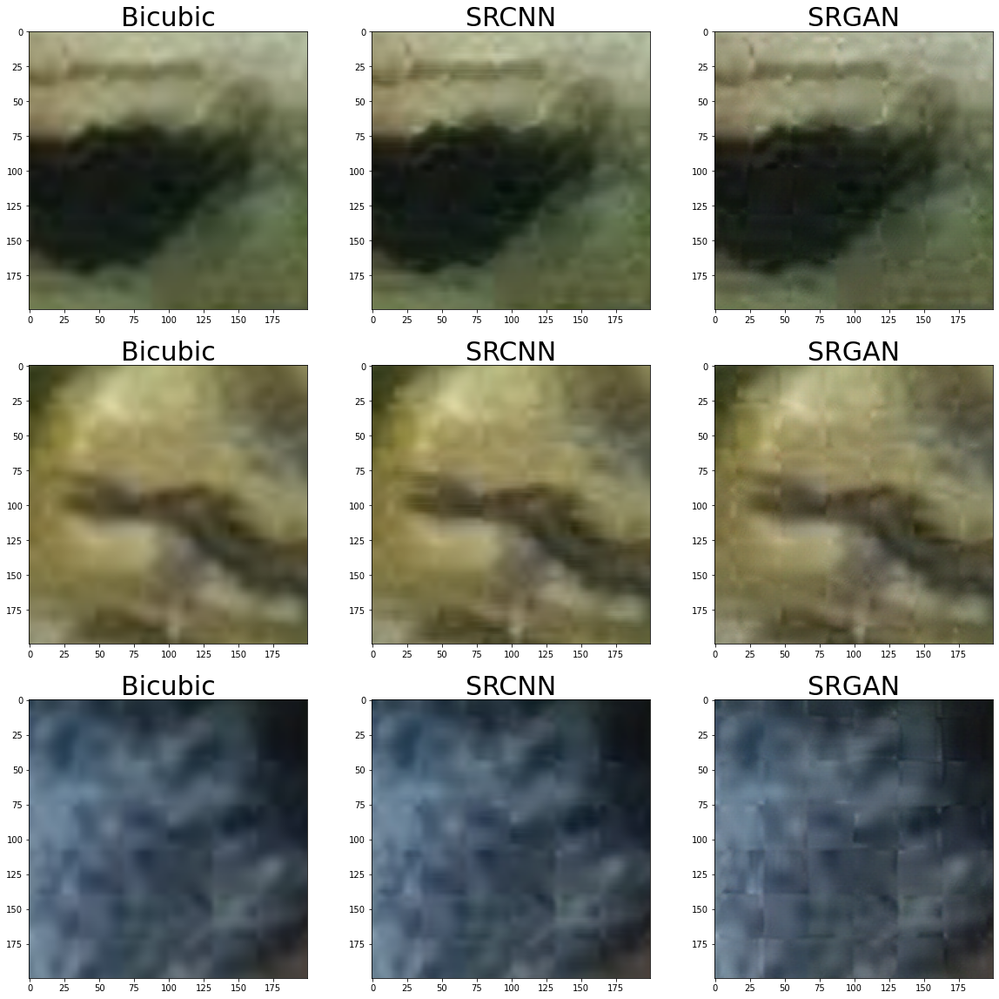

In [60]:
left_tops = [(700,1000), (900,1200), (500,2300)]

images = []
for left_top in left_tops:
    img1 = crop(bicubic_hr_img, left_top, 200, 200)
    img2 = crop(srcnn_hr_img , left_top, 200, 200)
    img3 = crop(srgan_hr_img, left_top, 200, 200)
    images.extend([img1, img2, img3])

labels = ["Bicubic", "SRCNN", "SRGAN"]*3

plt.figure(figsize=(20,20))
for i in range(9):
    plt.subplot(3,3,i+1) 
    plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
    plt.title(labels[i], fontsize=30)
plt.show()

Bicubic < SRCNN < SRGAN 순으로 노이즈 현상이 심해지는 것을 확인할 수 있습니다.

## 프로젝트 2 : SRGAN을 이용해 고해상도 gif 생성하기

이미 학습된 SRGAN을 이용해 저해상도 영상을 고해상도 영상으로 바꿔보는 프로젝트를 수행해 봅시다.

#### 1. gif 파일 불러오기

GIF files https://drive.google.com/drive/folders/1OLsa4btdwNUiVJcOJgZe_C6-lwEoNr4e

다운받은 gif 파일을 아래와 같은 과정을 통해 각 프레임(이미지)을 불러올 수 있습니다. frames이란 리스트 안에 각각의 프레임이 들어 있습니다.

In [2]:
import cv2

# 다운받은 파일의 경로를 설정해 주세요.
gif_path = os.getenv('HOME') + '/aiffel/super_resolution/'
gif = cv2.VideoCapture(gif_path + 'book_lr.gif')

isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)

print("frame 수 :", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수 : 22
frame 크기 : (215, 380, 3)


#### 2. 프레임별 Super Resolution 진행하기

Bicubic interpolation과 SRGAN을 이용해 각각의 가로, 세로 픽셀 수를 4배로 늘려봅시다. Super Resolution이 완료된 각각의 결과를 frames_sr이라는 리스트에 넣어주세요.

In [5]:
frames_sr_bicubic = []
for frame in frames:
    frames_sr_bicubic.append(cv2.resize(frame, 
        dsize=(frame.shape[1]*4, frame.shape[0]*4), 
        interpolation=cv2.INTER_CUBIC
    ))

In [6]:
frames_sr_srgan = []
for frame in frames:
    frames_sr_srgan.append(apply_srgan(frame))

#### 3. 프레임을 합쳐 gif 만들기
위에서 frame_sr을 만들었다면 아래 코드와 같이 gif 파일을 생성할 수 있습니다. Bicubic 및 SRGAN의 결과를 각각 저장하여 2개 파일을 만들어 주세요.

In [ ]:
import imageio

imageio.mimsave(os.path.join(gif_path, 'book_hr_bicubic.gif'), frames_sr_bicubic)
imageio.mimsave(os.path.join(gif_path, 'book_hr_srgan.gif'), frames_sr_srgan)

#### 4. Jupyter notebook에 gif 표시하기
아래와 같이 다운받은 저해상도 gif 파일과 고해상도 gif 파일을 각각 jupyter 내에 출력합니다.

|LR | HR_Bicubic | HR_SRGAN|
|:---:|:---:|:---:|
|![lr](https://drive.google.com/uc?export=view&id=1Y6hMxJdxvAQEPkWcMIfOzAqvtDTJ9Me-)| ![hr_bi](https://drive.google.com/uc?export=view&id=1auijBcyH5Tm4T_eYm2HdP6ZPkdGs-86B)| ![hr_gan](https://drive.google.com/uc?export=view&id=1c4brPMDTZFlkQ3w-oOslq0XhlBaLWCDf)|

#### 다른 이미지에도 모두 적용

In [17]:
def make_hr_gif(filename):
    gif = cv2.VideoCapture(os.path.join(gif_path, filename))

    isTrue = True
    frames = []
    while isTrue:
        isTrue, frame = gif.read()
        if isTrue:
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
    
    print("frame 수 :", len(frames))
    print("frame 크기 :", (frames[0].shape))

    frames_sr_bicubic = []
    for frame in frames:
        frames_sr_bicubic.append(cv2.resize(
            frame, 
            dsize=(frame.shape[1]*4, frame.shape[0]*4), 
            interpolation=cv2.INTER_CUBIC
        ))
        
    frames_sr_srgan = []
    for frame in frames:
        frames_sr_srgan.append(apply_srgan(frame))
    
    return frames_sr_bicubic, frames_sr_srgan

In [18]:
frames_sr_bicubic, frames_sr_srgan = make_hr_gif('fire_lr.gif')
imageio.mimsave(os.path.join(gif_path, 'fire_hr_bicubic.gif'), frames_sr_bicubic)
imageio.mimsave(os.path.join(gif_path, 'fire_hr_srgan.gif'), frames_sr_srgan)

frame 수 : 14
frame 크기 : (282, 300, 3)


|LR | HR_Bicubic | HR_SRGAN|
|:---:|:---:|:---:|
|![lr](https://drive.google.com/uc?export=view&id=1vxsuNHiKqMiYPHHG14nlxkCdzUa5iAu4)| ![hr_bi](https://drive.google.com/uc?export=view&id=1Ai1QOlvLwozzI4t_PbZCKVe5KS6S_Zm0)| ![hr_gan](https://drive.google.com/uc?export=view&id=1KJ2QsWlYlpH9k97K4VMHwd80rP3JCRPP)|

In [19]:
frames_sr_bicubic, frames_sr_srgan = make_hr_gif('wine_lr.gif')
imageio.mimsave(os.path.join(gif_path, 'wine_hr_bicubic.gif'), frames_sr_bicubic)
imageio.mimsave(os.path.join(gif_path, 'wine_hr_srgan.gif'), frames_sr_srgan)

frame 수 : 13
frame 크기 : (340, 355, 3)


|LR | HR_Bicubic | HR_SRGAN|
|:---:|:---:|:---:|
|![lr](https://drive.google.com/uc?export=view&id=1oI9jPITW0-QWweUPAypqcGLLdUnS-pB_)| ![hr_bi](https://drive.google.com/uc?export=view&id=1LqNXyBZbgiuPGUhqzni7ptaPGse3SbZf)| ![hr_gan](https://drive.google.com/uc?export=view&id=1Jul_BvlNsvvywIFw0fn7ZZhF2wQQZWOd)|

In [20]:
frames_sr_bicubic, frames_sr_srgan = make_hr_gif('metro_lr.gif')
imageio.mimsave(os.path.join(gif_path, 'metro_hr_bicubic.gif'), frames_sr_bicubic)
imageio.mimsave(os.path.join(gif_path, 'metro_hr_srgan.gif'), frames_sr_srgan)

frame 수 : 35
frame 크기 : (252, 282, 3)


|LR | HR_Bicubic | HR_SRGAN|
|:---:|:---:|:---:|
|![lr](https://drive.google.com/uc?export=view&id=1-xbXgwNh6oqvMFHnK7W-BPfL9_jGH2-r)| ![hr_bi](https://drive.google.com/uc?export=view&id=1D859W0NTnm6fTstM16T_uD9Duj9FE2-c)| ![hr_gan](https://drive.google.com/uc?export=view&id=18DpEJlzxx9WsvWkY-6_yQGumFq-iJ1lN)|

In [21]:
frames_sr_bicubic, frames_sr_srgan = make_hr_gif('city_night_lr.gif')
imageio.mimsave(os.path.join(gif_path, 'city_night_hr_bicubic.gif'), frames_sr_bicubic)
imageio.mimsave(os.path.join(gif_path, 'city_night_hr_srgan.gif'), frames_sr_srgan)

frame 수 : 8
frame 크기 : (255, 500, 3)


|LR | HR_Bicubic | HR_SRGAN|
|:---:|:---:|:---:|
|![lr](https://drive.google.com/uc?export=view&id=1ooHeOFBwUUmMdyNMgZgwpM4GBDK2fLcI)| ![hr_bi](https://drive.google.com/uc?export=view&id=1qw4Frv73fwVCrDK5MVil1TE6km0_E5cG)| ![hr_gan](https://drive.google.com/uc?export=view&id=1DQTMZCaMl44F_MXQFlQQiKHBhlBx22oA)|

[__GIF 파일 저장소__](https://drive.google.com/drive/u/0/folders/1slCCFcvSQ6iNcm2W4-lKHPNbpw6SI_iO)

## 프로젝트 정리

- Super Resolution과 그 과정 수행에 필요한 기본 개념을 정리하였다.
- Bicubic Interporation과 SRCNN 및 SRGAN을 이용해 고해상도의 이미지를 생성하였다.
- 시각화를 통해 원본과 interpolation 생성본, SRCNN 및 SRGAN생성본의 결과를 비교분석하였다.
- 사람의 눈으로 판단 한 결과와 정량적 척도를 이용한 결과의 분석이 상이한 점이 흥미로웠고, SRCNN 과 SRGAN은 사용된 알고리즘으로 인해 도메인 마다 판단의 기준이 달라질 수 있다는 점을 확인하였다.
- 저해상도 gif 동영상을 고해상도 동영상으로 성공적으로 변환하였으며,google drive에 저장된 gif 이미지를 노트북 셀에 표기하는 것을 배웠다.